# Plant Health Identification Project 🌿

---


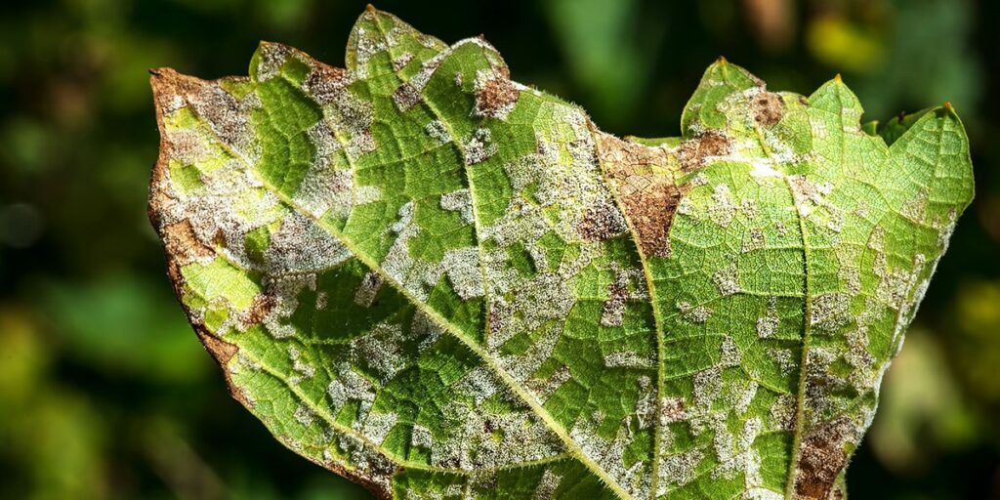
*(a multi-class classfication endeavour using Deep Learning)*

## 😴 TLDR
The Plant Health Identification Project aims to develop a deep learning-based system using the MobileNet V3 model to accurately classify images of plants into 38 different classes based on the disease they have. The project involves exploratory data analysis to understand the dataset's distribution, diversity, and labeling. Data preprocessing techniques will be applied, followed by model selection and transfer learning using the MobileNet V3 architecture. The model will be trained on the validation and training datasetsand evaluated on a test set using accuracy and multi-class log loss as metrics. Finally, the trained model will be deployed using the NatureSurfer robot. Through these steps, the project strives to create an efficient and reliable solution for identifying plant diseases


---


## 📊Dataset
The dataset used in this project consists of a collection of images (87,000 in totality) depicting various plant diseases. It is a labeled dataset (with labels being contained in `training_labels_csv` and `validation_labels_csv`), meaning each image is associated with a specific plant health issue.  


The aforementioned CSVs have been created by using file directories and were not included in the Kaggle dataset

New Plant Diseases Dataset. (2018, November 18). Kaggle. https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset/

---


## 🤔Approach
The project involves several steps to build the plant disease identification system:

🔍 1. **Exploratory Data Analysis:** Before proceeding with the model training, it is crucial to conduct exploratory data analysis (EDA) to gain insights into the dataset. This analysis aims to understand various aspects of the data.

- **EDA on the Labels CSV:** We will explore the labels CSV file, examining the available columns, data types, and any missing or erroneous values. This step ensures that the dataset is well-prepared for subsequent analyses and modeling tasks.

- **Spread of Data Between Classes:** We will analyze the distribution of the number of images across different diseases. This examination will help us identify any potential class imbalances or variations in the dataset.

- **Number of Unique diseases:** We will reconfirm the total number of diseases present in the dataset. This information will give us an idea of the diversity and variety of diseases captured.

- **Visualizing Disease classes:** We will create visualizations to showcase some diseases present in the dataset. This will provide a glimpse into the different classes and their representation in the data.


2. ⚙️**Data Preprocessing:** To prepare the data for training, it needs to be preprocessed. This includes converting the images into a suitable format for deep learning models, such as tensors or arrays. Additional preprocessing steps may involve converting read images to jpegs, resizing the images and normalizing pixel values.

3. ✨**Model Selection:** For this project, the MobileNet V3 model will be utilized. MobileNet V3 is a lightweight neural network architecture designed for mobile and embedded devices. It strikes a balance between model size and accuracy, making it an excellent choice for this plant health identification task. To know more about this model, you may utilize this link: https://paperswithcode.com/method/mobilenetv3

4. 🛠️ **Model Creation:** To create the neural network model for plant health identification, we will employ the MobileNet V3 architecture, initialized with pre-trained params from a large-scale image classification dataset - namely the ImageNet dataset (you can find more about it here: https://shorturl.at/fxEHK). This approach, known as transfer learning, allows us to leverage knowledge gained from a diverse range of images and apply it to our specific task. We will add a Dense layer with an appropriate activation function to the model to adapt it for disease classification. After compiling the model with the CategoricalCrossentropy loss (measures how close the predictions of the model are to the actual data), Adam optimizer (changes weights and other parameters to ensure to minimum loss when the model is learning), and accuracy metric, we will build the model using the specified input shape.

5. 🏃‍♂️**Model Training:** The preprocessed dataset will be split into training and validation sets. The training set will be used to train the MobileNet V3 model, while the validation set will be used to monitor the model's performance and tune hyperparameters. During training, the model will learn to classify images into the 38 unique classes on the provided labels. TensorBoard will be utilized to create logs and track training metrics for better analysis. Additionally, Early Stopping with a patience of 3 epochs will be employed during training. We will also be using a library called `mlnotify`. `mlnotify` is a powerful library designed for machine learning practitioners to monitor and track their model training progress directly on their smartphones. *finally, please note that the preliminary model would only be trained on 10000 images to ensure that everything is working properly. After a preliminary design is created, the entire dataset would be utilized. This is done in a bid to save time*

6. 🧪**Model Evaluation**:

  After training, the performance of the model will be evaluated using the validation set itself. Further evaluation would be done on by creating `preds_df`.  The accuracy of the model in classifying the plant diseases will be assessed by comparing its predictions to the ground truth labels.

  In addition to accuracy, we will employ the multi-class log loss as an evaluation metric. The multi-class log loss, also known as cross-entropy loss, measures the performance of the model by considering the probabilities assigned to each class. It penalizes the model for assigning low probabilities to the correct classes and rewards confident and accurate predictions.

  The formula for multi-class log loss is expressed as:

  $$\text{log loss} = - \frac{1}{N} \sum_{i=1}^{N} \sum_{j=1}^{M} y_{ij} \log(p_{ij})$$

  Where:
  - $N$ is the number of samples in the test set.
  - $M$ is the number of unique plant diseases in the dataset.
  - $(y_{ij})$ is the binary indicator (0 or 1) if the sample $(i)$ belongs to class $( j)$.
  - $(p_{ij})$ is the predicted probability by the model that sample i belongs to class (j).

By utilizing the multi-class log loss, we can assess the model's performance in a more detailed manner, considering the confidence and accuracy of its predictions across all disease classes.

7. 🚀**Deployment:** Once the model has been trained and evaluated, it can be deployed to classify plant diseaes in our custom dataset. The system can take an input image of a plant's leaf, apply the trained MobileNet V3 model, and predict the most likely class from the 38 unique classes in the dataset. For the proof of concept stage, we will be utilizing `Gradio`



By following these steps, we can develop an accurate plant disease identiication using the MobileNet V3 model. Let's proceed with the implementation and create an efficient and reliable solution for identifying diseases!


In [ ]:
 #CODE NOT TO BE RUN UNLESS FILES ARE ABSENT
!unzip "/content/drive/MyDrive/Colab Notebooks/plant-health-project/archive (1).zip" -d "/content/drive/MyDrive/Colab Notebooks/plant-health-project/"

In [ ]:
# mounting drive and libraries
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#code already ran; removed output to make it look cleaner
!pip install gradio

In [ ]:
#code already ran; removed output to make it look cleaner
!pip install mlnotify

In [1]:
%matplotlib inline
# visualization
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import matplotlib.image as mpimg
import seaborn as sns
#
from PIL import Image
from IPython.display import Image as im

# model building and handling data
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_hub as hub

from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#  managing functions
import functools
# handling CSVs
import pandas as pd

# numerical computation
import numpy as np

# randomization
import random as rn

# handling directories
import os

# time
import time
import datetime


In [ ]:
def show_download_symbol(duration, interval, waiting_message):
    '''
    Displays a rotating downloading symbol for a specified duration.

    Parameters:
        - duration (float): The total duration (in seconds) to display the rotating symbol.
        - interval (float): The time interval (in seconds) between each rotation.
        - waiting_message (str): The message to display while waiting.

    Returns:
        None

    Displays a rotating downloading symbol, consisting of '|', '/', '-', and '\',
    to indicate an ongoing download process. The symbol rotates
    for the specified duration with the given time interval
    between each rotation. The waiting message is displayed
    alongside the symbol during the waiting period.

    Example usage:
        show_download_symbol(10, 0.5, "Downloading file...")
    '''
    iterations = int(duration / interval)

    for i in range(iterations):
        print(f"\r{waiting_message} |", end="")
        time.sleep(interval / 4)
        print(f"\r{waiting_message} /", end="")
        time.sleep(interval / 4)
        print(f"\r{waiting_message} -", end="")
        time.sleep(interval / 4)
        print(f"\r{waiting_message} \\ ", end="")
        time.sleep(interval / 4)
    print("\n")

def format_underscores(input_string):
    '''
    Formats an input string by capitalizing each word separated by underscores.

    Parameters:
        - input_string (str): The input string containing underscores.

    Returns:
        str: The formatted string with words capitalized and underscores replaced by spaces.

    Example usage:
        formatted_string = format_underscores("hello_world")
        print(formatted_string)  # Output: "Hello World"
    '''
    words = input_string.split('_')
    formatted_words = [word.capitalize() for word in words]
    formatted_string = ' '.join(formatted_words)
    return formatted_string

def list_to_string(input_list, commas=False):
    '''
    Converts a list of items into a formatted string.

    Parameters:
        - input_list (list): The list of items to be converted to a string.
        - commas (bool): If True, separate items with commas; otherwise, separate with spaces.

    Returns:
        str: The formatted string containing items from the list.

    Example usage:
        items = ['apple', 'banana', 'orange']
        result_string = list_to_string(items, commas=True)
        print(result_string)  # Output: "apple, banana, orange"
    '''
    # Convert each item in the list to a string
    str_list = [format_underscores(str(item)) for item in input_list]
    # Join the items with spaces between them
    if commas:
        result_string = ', '.join(str_list)
    else:
        result_string = " ".join(str_list)
    return result_string


def select_n_random_items(lst, n):
  lst_copy = lst.copy()
  selected_items = []
  for i in range (1, n + 1):
    item = rn.choice(lst_copy)
    selected_items.append(item)
    lst_copy.remove(item)

  return selected_items

def return_disease_plant_name(string):
    """
    Extracts the name and disease information from a label string in the format '<name>__<disease>_<disease>'.

    Parameters:
    - string (str): A string containing information in the format '<name>__<disease>_<disease>'.

    Returns:
    - tuple: A tuple containing two elements:
        - name (str): The name extracted from the input string.
        - disease (str): The disease information extracted from the input string, with multiple underscores formatted.

    Example:
    If the input string is 'plant_name__leaf_spot_disease', this function will return ('plant_name', 'leaf spot disease').

    Note:
    The function assumes that the input string follows the specified format, with double underscores separating the name and disease information.

    """
    first_underscore_index = string.find('_')
    name = format_underscores(string[0:first_underscore_index])
    disease = format_underscores(string[first_underscore_index + 2:])
    return (name, disease)


In [ ]:

# checking tensorflow and tf hub version
print(f'''
1. TF hub version {hub.__version__}
2. TF version {tf.__version__}
'''
)

# latest version of both TF Hub and TF as of today


1. TF hub version 0.15.0
2. TF version 2.14.0



In [ ]:
# GPU availability
if tf.config.list_physical_devices():
  print('GPU available')
else:
  print('No GPU available')

GPU available


In [ ]:
training_classes = os.listdir('/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train')
valid_classes = os.listdir('/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid')

In [ ]:
training_file_paths = []
training_class_labels = []
for training_class in training_classes:
  class_file_paths = os.listdir(f'/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/{training_class}')
  for fl in class_file_paths:
    training_file_paths.append(f'/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/{training_class}/{fl}')
    training_class_labels.append(training_class)

validation_file_paths = []
validation_class_labels = []
for validation_class in valid_classes:
  class_file_paths = os.listdir(f'/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/{validation_class}')
  for fl in class_file_paths:
    validation_file_paths.append(f'/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/{validation_class}/{fl}')
    validation_class_labels.append(validation_class)

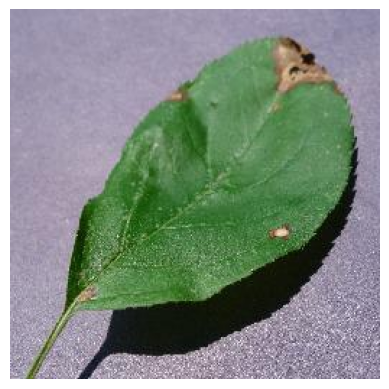

Apple___Black_rot


In [ ]:

# random image from validation dataset

#image path
image_path = validation_file_paths[1000]

# Load the image
image = mpimg.imread(image_path)

# Display the image
plt.imshow(image)
plt.axis('off')  # Turn off axis labels and ticks
plt.show()
print(validation_class_labels[1000])

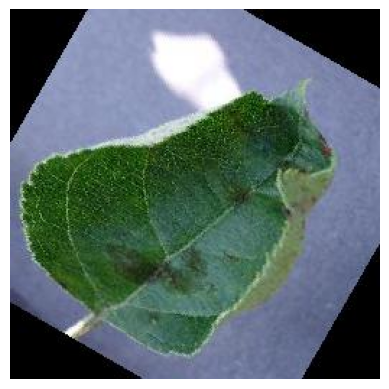

Tomato___healthy


In [ ]:
# random image from the training dataset

# image path
image_path = training_file_paths[23]

# Load the image
image = mpimg.imread(image_path)

# Display the image
plt.imshow(image)
plt.axis('off')  # Turn off axis labels and ticks
plt.show()
print(validation_class_labels[-1])

In [ ]:
len(training_file_paths), len(training_class_labels), len(validation_file_paths), len(validation_class_labels)

(70295, 70295, 17572, 17572)

In [ ]:
len(training_classes), len(valid_classes)

(38, 38)

In [ ]:
training_labels_csv = pd.DataFrame({'FilePath':training_file_paths, 'Label':training_class_labels})
training_labels_csv.to_csv('/content/drive/MyDrive/Colab Notebooks/plant-health-project/training-labels.csv')
training_labels_csv = training_labels_csv.sample(frac = 1)
training_labels_csv.reset_index(drop=True, inplace=True)

valid_labels_csv = pd.DataFrame({'FilePath':validation_file_paths, 'Label':validation_class_labels})
valid_labels_csv.to_csv('/content/drive/MyDrive/Colab Notebooks/plant-health-project/valid-labels.csv')
valid_labels_csv = valid_labels_csv.sample(frac = 1)
valid_labels_csv.reset_index(drop=True, inplace=True)
#order of files randomised to prevent overfitting

In [ ]:
valid_labels_csv

,FilePath,Label
0,/content/drive/MyDrive/Colab Notebooks/plant-h...,Grape___Esca_(Black_Measles)
1,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Target_Spot
2,/content/drive/MyDrive/Colab Notebooks/plant-h...,Potato___healthy
3,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Tomato_mosaic_virus
4,/content/drive/MyDrive/Colab Notebooks/plant-h...,Corn_(maize)___Common_rust_
...,...,...
17567,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Tomato_Yellow_Leaf_Curl_Virus
17568,/content/drive/MyDrive/Colab Notebooks/plant-h...,Soybean___healthy
17569,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Spider_mites Two-spotted_spider_mite
17570,/content/drive/MyDrive/Colab Notebooks/plant-h...,Corn_(maize)___Common_rust_


In [ ]:
training_labels_csv

,FilePath,Label
0,/content/drive/MyDrive/Colab Notebooks/plant-h...,Corn_(maize)___Common_rust_
1,/content/drive/MyDrive/Colab Notebooks/plant-h...,Squash___Powdery_mildew
2,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Early_blight
3,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Early_blight
4,/content/drive/MyDrive/Colab Notebooks/plant-h...,Peach___Bacterial_spot
...,...,...
70290,/content/drive/MyDrive/Colab Notebooks/plant-h...,Strawberry___healthy
70291,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Spider_mites Two-spotted_spider_mite
70292,/content/drive/MyDrive/Colab Notebooks/plant-h...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
70293,/content/drive/MyDrive/Colab Notebooks/plant-h...,Tomato___Septoria_leaf_spot


[]

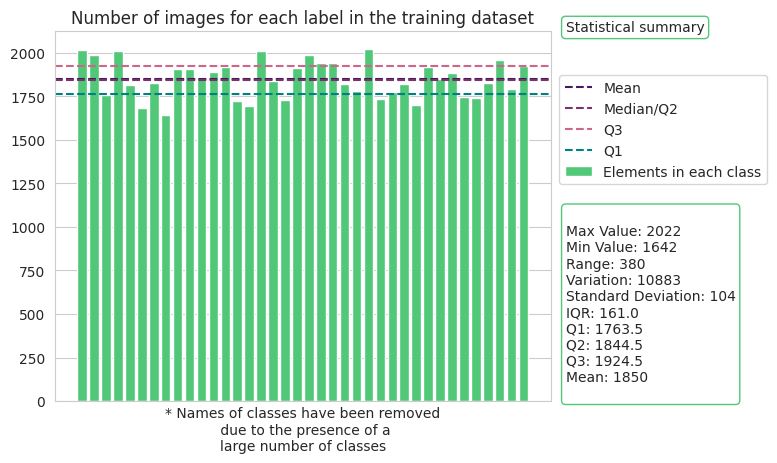

<Figure size 640x480 with 0 Axes>

In [ ]:
# setting seaborn style
sns.set_style('whitegrid')

# Preparing unique_diseases and the number of times they occur in the dataset
unique_diseases, value_counts = np.unique(training_labels_csv['Label'], return_counts=True)

# Preparing the plot
fig, ax = plt.subplots()
plt.figure(facecolor='#000000')
ax.bar(unique_diseases, value_counts, label='Elements in each class', color='#50C878', align = 'edge')
ax.axhline(y=np.mean(value_counts), color='#461959', linestyle='--', label='Mean')
ax.axhline(y=np.percentile(value_counts, 50), color='#7A316F', linestyle='--', label='Median/Q2')
ax.axhline(y=np.percentile(value_counts, 75), color='#CD6688', linestyle='--', label='Q3')
ax.axhline(y=np.percentile(value_counts, 25), color='teal', linestyle='--', label='Q1')
ax.legend(bbox_to_anchor=(1.45, 0.9), loc='upper right')

# Annotation text for statistical summary
callout_text = f'''
Max Value: {max(value_counts)}
Min Value: {min(value_counts)}
Range: {max(value_counts) - min(value_counts)}
Variation: {round(np.var(value_counts))}
Standard Deviation: {round(np.std(value_counts))}
IQR: {np.percentile(value_counts, 75) - np.percentile(value_counts, 25)}
Q1: {np.percentile(value_counts, 25)}
Q2: {np.percentile(value_counts, 50)}
Q3: {np.percentile(value_counts, 75)}
Mean: {round(np.mean(value_counts))}
'''
callout_text_header = f'Statistical summary'
ax.annotate(callout_text, xy=(1.03, 0.01), xycoords='axes fraction',
            bbox=dict(boxstyle='round', facecolor='white', edgecolor='#50C878'))
ax.annotate(callout_text_header, xy=(1.03, 1.0), xycoords='axes fraction',
            bbox=dict(boxstyle='round', facecolor='white', edgecolor='#50C878'))


ax.set(title='Number of images for each label in the training dataset', xlabel='* Names of classes have been removed\n due to the presence of a\nlarge number of classes')
ax.set_xticks([])


In [ ]:
unique_diseases, len(unique_diseases)

(array(['Apple___Apple_scab', 'Apple___Black_rot',
        'Apple___Cedar_apple_rust', 'Apple___healthy',
        'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew',
        'Cherry_(including_sour)___healthy',
        'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
        'Corn_(maize)___Common_rust_',
        'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy',
        'Grape___Black_rot', 'Grape___Esca_(Black_Measles)',
        'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy',
        'Orange___Haunglongbing_(Citrus_greening)',
        'Peach___Bacterial_spot', 'Peach___healthy',
        'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy',
        'Potato___Early_blight', 'Potato___Late_blight',
        'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy',
        'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch',
        'Strawberry___healthy', 'Tomato___Bacterial_spot',
        'Tomato___Early_blight', 'Tomato___

[]

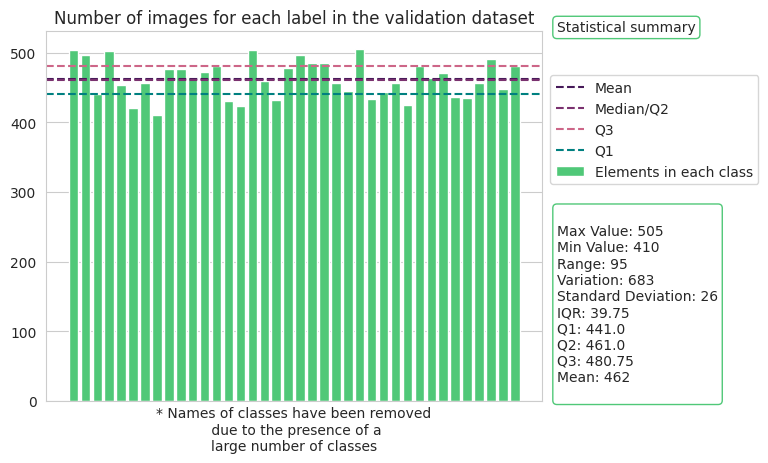

<Figure size 640x480 with 0 Axes>

In [ ]:

# setting seaborn style
sns.set_style('whitegrid')

# Preparing unique_diseases and the number of times they occur in the dataset
unique_diseases, value_counts = np.unique(valid_labels_csv['Label'], return_counts=True)

# Preparing the plot
fig, ax = plt.subplots()
plt.figure(facecolor='#000000')
ax.bar(unique_diseases, value_counts, label='Elements in each class', color='#50C878', align = 'edge')
ax.axhline(y=np.mean(value_counts), color='#461959', linestyle='--', label='Mean')
ax.axhline(y=np.percentile(value_counts, 50), color='#7A316F', linestyle='--', label='Median/Q2')
ax.axhline(y=np.percentile(value_counts, 75), color='#CD6688', linestyle='--', label='Q3')
ax.axhline(y=np.percentile(value_counts, 25), color='teal', linestyle='--', label='Q1')
ax.legend(bbox_to_anchor=(1.45, 0.9), loc='upper right')

# Annotation text for statistical summary
callout_text = f'''
Max Value: {max(value_counts)}
Min Value: {min(value_counts)}
Range: {max(value_counts) - min(value_counts)}
Variation: {round(np.var(value_counts))}
Standard Deviation: {round(np.std(value_counts))}
IQR: {np.percentile(value_counts, 75) - np.percentile(value_counts, 25)}
Q1: {np.percentile(value_counts, 25)}
Q2: {np.percentile(value_counts, 50)}
Q3: {np.percentile(value_counts, 75)}
Mean: {round(np.mean(value_counts))}
'''
callout_text_header = f'Statistical summary'
ax.annotate(callout_text, xy=(1.03, 0.01), xycoords='axes fraction',
            bbox=dict(boxstyle='round', facecolor='white', edgecolor='#50C878'))
ax.annotate(callout_text_header, xy=(1.03, 1.0), xycoords='axes fraction',
            bbox=dict(boxstyle='round', facecolor='white', edgecolor='#50C878'))


ax.set(title='Number of images for each label in the validation dataset', xlabel='* Names of classes have been removed\n due to the presence of a\nlarge number of classes')
ax.set_xticks([])


In [ ]:

# function to show n plant diseases
def show_plant_diseases(n = 5,
                    path_list = training_file_paths,
                    random_state = 404, n_cols = 5,
                    labels = training_labels_csv['Label'],
                    disease_name = None):
  """
    Display n random images of plant diseases from the dataset.

    Parameters:
        n (int, optional): Number of random images to display. Default is 5.
        path_list (list, optional): List of file paths to images. Default is `filepaths`.
        random_state (int, optional): Random seed for shuffling images. Default is 42.
        n_cols (int, optional): Number of columns in the displayed image grid. Default is 5.
        labels (numpy array, optional): Array of labels corresponding to the file paths. Default is `np.array(labels_csv['Label'])`.
        disease_name (str, optional): If specified, only display images of the specified plant disease. Default is None.

    Returns:
        None: This function displays the images using Matplotlib.

    Note:
        - If disease_name is None, the function randomly shuffles the images and displays n of them.
        - If disease_name is specified, the function displays n images of the given disease (if available).
        - The images are plotted in a grid with n_cols columns.
        - The function assumes that images are stored in the provided file paths.
  """
  np.random.seed(random_state)
  if disease_name == None:
    # shuffling file paths and labels
    combined = list(zip(training_class_labels, training_file_paths))
    np.random.shuffle(combined)
    output_labels, output_path_list = zip(*combined)
  else:
    filtered_labels_csv = training_labels_csv[training_labels_csv['Label'] == disease_name]
    output_labels = np.array(filtered_labels_csv['Label'])
    output_path_list = filtered_labels_csv['FilePath']

  # calculating number of rows
  n_rows = (n // n_cols) + 1

  # plotting image
  plt.figure(figsize = (15, 15))
  plt.suptitle(f'{n} random photos from the dataset!', fontsize = 42)

  for i in range(n):
    image = Image.open(output_path_list[i])
    ax = plt.subplot(n_rows, n_cols, i + 1)
    ax.imshow(image)
    ax.set_xlabel(f'''Name: {return_disease_plant_name(output_labels[i])[0]}
Disease: {return_disease_plant_name(output_labels[i])[1]}
    ''', fontsize = 12)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.grid(False)
  plt.tight_layout()
  plt.show()

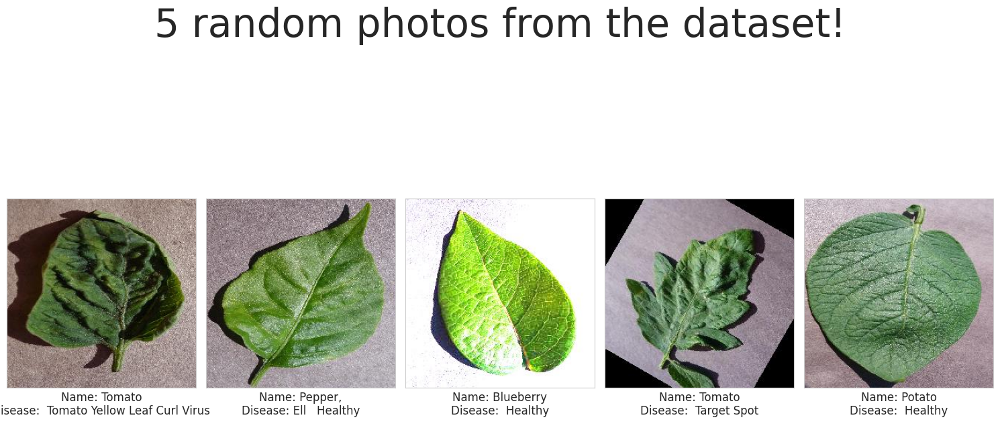

In [ ]:
show_plant_diseases()

In [ ]:
# preparing labels, boolean_labels
training_labels = np.array(training_labels_csv['Label'])
training_boolean_labels = [label == unique_diseases for label in training_labels]


validation_labels = np.array(valid_labels_csv['Label'])
validation_boolean_labels = [label == unique_diseases for label in validation_labels]

In [ ]:
len(training_labels), len(training_boolean_labels), len(validation_labels), len(validation_boolean_labels)

(70295, 70295, 17572, 17572)

In [ ]:
training_labels[:10]

array(['Apple___Black_rot', 'Apple___Apple_scab', 'Grape___healthy',
       'Tomato___Leaf_Mold', 'Apple___Black_rot', 'Tomato___Leaf_Mold',
       'Blueberry___healthy', 'Corn_(maize)___Common_rust_',
       'Cherry_(including_sour)___Powdery_mildew', 'Peach___healthy'],
      dtype=object)

In [ ]:
np.argmax(training_boolean_labels[20]), (unique_diseases.tolist()).index(training_labels[20])

(30, 30)

In [ ]:
# setting up features and labels for validation and training respectively
X_train, X_val, y_train, y_val = training_labels_csv['FilePath'], valid_labels_csv['FilePath'], training_boolean_labels, validation_boolean_labels

In [ ]:
unique_diseases[np.argmax(training_boolean_labels[20])], X_train[20]

('Tomato___Late_blight',
 '/content/drive/MyDrive/Colab Notebooks/plant-health-project/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Late_blight/c95eaeb8-7673-4411-bbbe-b2464526f303___RS_Late.B 6233.JPG')

In [ ]:
len(X_train), len(X_val), len(y_train), len(y_val)

(70295, 17572, 70295, 17572)

For the process of turning the image into tensors, the following steps will be followed
1. Take the filepath of the image as the input.
2. Use TensorFlow to read the image file and store it in a variable called `image`.
3. Resize the image to a desired size. In our case, this would be 224, 224 (height, width) since the model, was trained on images of the said size
4. Normalize the image by scaling its pixel values.
5. Convert the image into a tensor using `tf.constant()`.
6. Return the processed image tensor as the output.


In [ ]:
# turning images into tensors

# an example image from the dataset -->

image = tf.constant(imread(training_file_paths[42]))
image.shape


TensorShape([256, 256, 3])

In [ ]:
def process_image(image_path):
    """
    Preprocesses an image file.

    Args:
        image_path (str): The file path of the image.

    Returns:
        tf.Tensor: Preprocessed image tensor.

    Preprocesses an image file by reading the image from the specified file path, decoding it as a JPEG image,
    normalizing the pixel values, and resizing the image to a target size of (224, 224) pixels.

    Returns the preprocessed image as a tensor.

    """
    # read in the image file from the filepath
    image = tf.io.read_file(image_path)
    # decode the image to a jpeg
    image = tf.image.decode_jpeg(image, channels=3)
    # image normalization
    image = tf.image.convert_image_dtype(image, tf.float32)
    # resize the image
    image = tf.image.resize(image, size=(224, 224))

    return image

def get_image_label(image_path, label):
    """
    Loads and preprocesses an image from the given file path and associates it with the corresponding label.

    Args:
        image_path (str): The file path of the image.
        label (as a boolean label): The label for the image.

    Returns:
        Tuple[tf.Tensor, boolean label]: A tuple containing the preprocessed image tensor and the associated label.
    """
    image = process_image(image_path)
    return (image, label)

In [ ]:
def get_data_batches(X, y = None, batch_size = 32, valid_data = False, test_data = False, deployment = False):
  """
    Create batches of data for training, validation, or testing.

    Parameters:
        X (numpy array): Input data (image file paths) as a NumPy array.
        y (numpy array, optional {not given when creating batched for test data}): Labels for the input data. Default is None.
        batch_size (int, optional): Size of each batch. Default is 32.
        valid_data (bool, optional): If True, create batches for validation data. Default is False.
        test_data (bool, optional): If True, create batches for test data. Default is False.
        deployment (bool, optional): If True, don't show download symbol. Default is False.

    Returns:
        tf.data.Dataset: A TensorFlow Dataset containing the data in batches.

    Note:
        - If `test_data` is True, the function creates batches for test data without labels.
        - If `valid_data` is True, the function creates batches for validation data with labels.
        - If both `valid_data` and `test_data` are False, the function creates batches for training data with labels.
        - The input data (X) and labels (y) are converted to TensorFlow constant tensors.
        - The `process_image` and `get_image_label` functions are used to process the images and labels.
        - For training data, the dataset is shuffled before creating batches. This is in a bid to remove bias
    """
  if test_data:
    if deployment:
      data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
      data_batch = data.map(process_image).batch(batch_size)
    else:
      show_download_symbol(waiting_message = "Creating test data batches", duration = 2, interval = 0.01)
      data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
      data_batch = data.map(process_image).batch(batch_size)
  elif valid_data:
    show_download_symbol(waiting_message='Creating valid data batches', duration = 2, interval = 0.02)
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
  else:
    show_download_symbol(waiting_message = 'Creating a training data batch', duration = 2, interval = 0.4)
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(batch_size)

  return data_batch

In [ ]:
train_data = get_data_batches(X_train, y_train)
val_data = get_data_batches(X_val, y_val, valid_data = True)

Creating a training data batch \ 

Creating valid data batches \ 



In [ ]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 38), dtype=tf.bool, name=None))

In [ ]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 38), dtype=tf.bool, name=None))

In [ ]:
# visualizing batches
def visualize_batches(images, labels):
  """
  Visualizes a batch of images and their corresponding labels.

  Parameters:
      images (numpy array): A batch of preprocessed images to be visualized.
      labels (numpy array): The corresponding labels for the images, typically in one-hot encoded format - boolean labels.

  Visualization:
      The function creates a 5x5 grid of subplots to display 25 images from the batch.
      It sets the title of the entire visualization using `plt.suptitle()`,
      indicating that it shows the first batch of photos.
      For each image, it creates a subplot using `plt.subplot()` and displays the image using `plt.imshow()`.
      The title of each subplot shows the predicted disease label associated with the image.
      The axes of the subplots are turned off to remove any unnecessary clutter.

  Returns:
      This function does not return any value.
      Instead, it generates a visual representation of the batch of images and their labels on the Matplotlib plot.
  """
  plt.figure(figsize = (20, 20))
  plt.suptitle('25 Photos from a training batch!', fontsize = 32, fontweight = 'bold')
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(f'''
Name: {return_disease_plant_name(unique_diseases[labels[i].argmax()])[0]}
Disease: {return_disease_plant_name(unique_diseases[labels[i].argmax()])[1]}
           ''')
    plt.axis('off')
  plt.tight_layout()


In [ ]:
# debatching images
debatched_images, debatched_labels = next(train_data.as_numpy_iterator())

In [ ]:
visualize_batches(debatched_images, debatched_labels)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# intialising input shape of for the model
INPUT_SHAPE = (224, 224, 3)
OUTPUT_SHAPE = 38
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5'


### **📝 Model Creation Checklist:**
- [✅] Define the function `create_model()` to create a neural network model using TensorFlow and Keras.
- [✅] Load a pre-trained model using `hub.KerasLayer(MODEL_URL)`, where `MODEL_URL` is the URL to the pre-trained model.
- [✅] Add a Dense layer to the model with `units = OUTPUT_SHAPE` and `activation = 'softmax'`. The number of units in the Dense layer depends on `OUTPUT_SHAPE`.
- [✅] Compile the model using `model.compile()` with the CategoricalCrossentropy loss function, Adam optimizer, and accuracy metric.
- [✅] Build the model with a specified input shape using `model.build(INPUT_SHAPE)`.
- [✅] Return the compiled and built model.

### **📝 Model Summary:**
- [✅] Create the model using `create_model()` and store it in the variable `model`.
- [✅] Display a summary of the model's architecture using `model.summary()`.

### **📝 TensorBoard Callback:**
- [✅] Define the function `create_tensorbord_callback()` to create a TensorBoard callback for logging training metrics.
- [✅] Generate a log directory path based on the current timestamp using `datetime.datetime.now().strftime("%Y%m%d-%h%m%s")`.
- [✅] Return a TensorBoard callback object pointing to the log directory.

### **📝 Early Stopping Callback:**
- [✅] Create an EarlyStopping callback using `tf.keras.callbacks.EarlyStopping`.
- [✅] Monitor the validation accuracy during training using `monitor = 'val_accuracy'`.
- [✅] Set a patience of 3 epochs before early stopping if there is no improvement in validation accuracy.


In [ ]:
# creating model
def create_model():
  ''' Create a deep learning model for image classification using MobileNetV3 as a base.

    This function constructs a Sequential model using the TensorFlow Keras API. The base of the model is MobileNetV3,
    a pre-trained model available through TensorFlow Hub. The model is compiled with the CategoricalCrossentropy loss
    function, Adam optimizer, and accuracy as the evaluation metric.

    Returns:
        tf.keras.Model: The created deep learning model.

    Example:
        # Create the model
        model = create_model()
  '''
  show_download_symbol(duration = 2, interval = 0.2, waiting_message = 'Building model using Mobile Net V3')

  # setting  up model layers
  model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL, input_shape=INPUT_SHAPE),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax')
    ])
  # compiling model
  model.compile(loss = tf.keras.losses.CategoricalCrossentropy(), optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy'])

  # building model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model using Mobile Net V3 \ 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5508713   
                                                                 
 dense (Dense)               (None, 38)                38076     
                                                                 
Total params: 5546789 (21.16 MB)
Trainable params: 38076 (148.73 KB)
Non-trainable params: 5508713 (21.01 MB)
_________________________________________________________________


### 📱 Creating call backs
Call backs are helper functions that a model can use during trainig to do such things as save its progress, check its progress and terminate training if the model stops improving.

We'll create two call backs
- Tensorboard- checking progress and logs
- Early stopping call back

In [ ]:
%load_ext tensorboard

In [ ]:
def create_tensorboard_callback():
  # create a log directory for storing Tensorboard logs
  current_time = datetime.datetime.now()
  log_dir = os.path.join("/content/drive/MyDrive/Colab Notebooks/plant-health-project/Logs", f"{current_time.day}-{current_time.month}-{current_time.year}__{current_time.hour}:{current_time.minute}:{current_time.second}")
  return tf.keras.callbacks.TensorBoard(log_dir, histogram_freq = 1, write_graph = True)


In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy', patience = 3)

In [ ]:
# training the model
NUM_EPOCHS = 1#@param {type:"slider", min:1, max:100, step:2}

In [ ]:
def train_model():
  """Trains a given deep learning model on the provided training data.

    This function takes a deep learning model, provided by the `create_model` function, and trains it on the given
    training data. The training process includes the use of validation data for monitoring model performance during
    training. The training can be stopped early based on a specified `early_stopping` callback.

    Args:
        train_data (numpy.ndarray or tf.data.Dataset): The training data.
        val_data (numpy.ndarray or tf.data.Dataset): The validation data used for monitoring performance during training.
        NUM_EPOCHS (int): The number of training epochs.
        early_stopping (tf.keras.callbacks.EarlyStopping): A callback that monitors a certain metric to stop training early
                                                          if no improvement is observed.

    Returns:
        tf.keras.Model: The trained deep learning model.
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data, epochs = NUM_EPOCHS,
            validation_data = val_data, validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model

In [ ]:
%%notify
mlnotify.start()
model = train_model()
save_model(model, suffix = 'complete-model-2-epochs')

In [ ]:
model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  current_time = datetime.datetime.now()
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/plant-health-project/",
                          )
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  show_download_symbol(duration  = 2, interval = 0.4, waiting_message = f'saving model...')
  model.save(model_path)
  print('Successful')
  return model_path

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  show_download_symbol(duration  = 2, interval = 0.4, waiting_message = f'loading model...')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  print('Successful')
  return model

In [ ]:
save_model(model, suffix = 'initial-model')

saving model... \ 



/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Successful


'/content/drive/MyDrive/Colab Notebooks/plant-health-project/-initial-model.h5'

In [ ]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/plant-health-project/-complete-model-2-epochs.h5")

In [ ]:
model

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/plant-health-project/Logs"

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
X_train, X_val, y_train, y_val = training_labels_csv['FilePath'], valid_labels_csv['FilePath'][:80], training_boolean_labels, validation_boolean_labels[:80]
val_data = get_data_batches(X_val, y_val, valid_data = True)


Creating valid data batches \ 



In [ ]:
# making predictions on the validation data
predictions = model.predict(val_data)

# creating true labels and true images
unbatched_val_data = val_data.unbatch()
true_images = []
true_labels = []

for image, label in unbatched_val_data:
    true_images.append(image.numpy())  # Convert the TensorFlow tensor to a numpy array
    true_labels.append(unique_diseases[np.argmax(label.numpy())])

In [ ]:
# shuffling images
# Zip the three lists together
np.random.seed(43)
zipped_lists = list(zip(true_images, true_labels, predictions))

# Shuffle the zipped list
np.random.shuffle(zipped_lists)

# Unzip the shuffled list to get the shuffled lists back
true_images_shuffled, true_labels_shuffled, predictions_shuffled = zip(*zipped_lists)

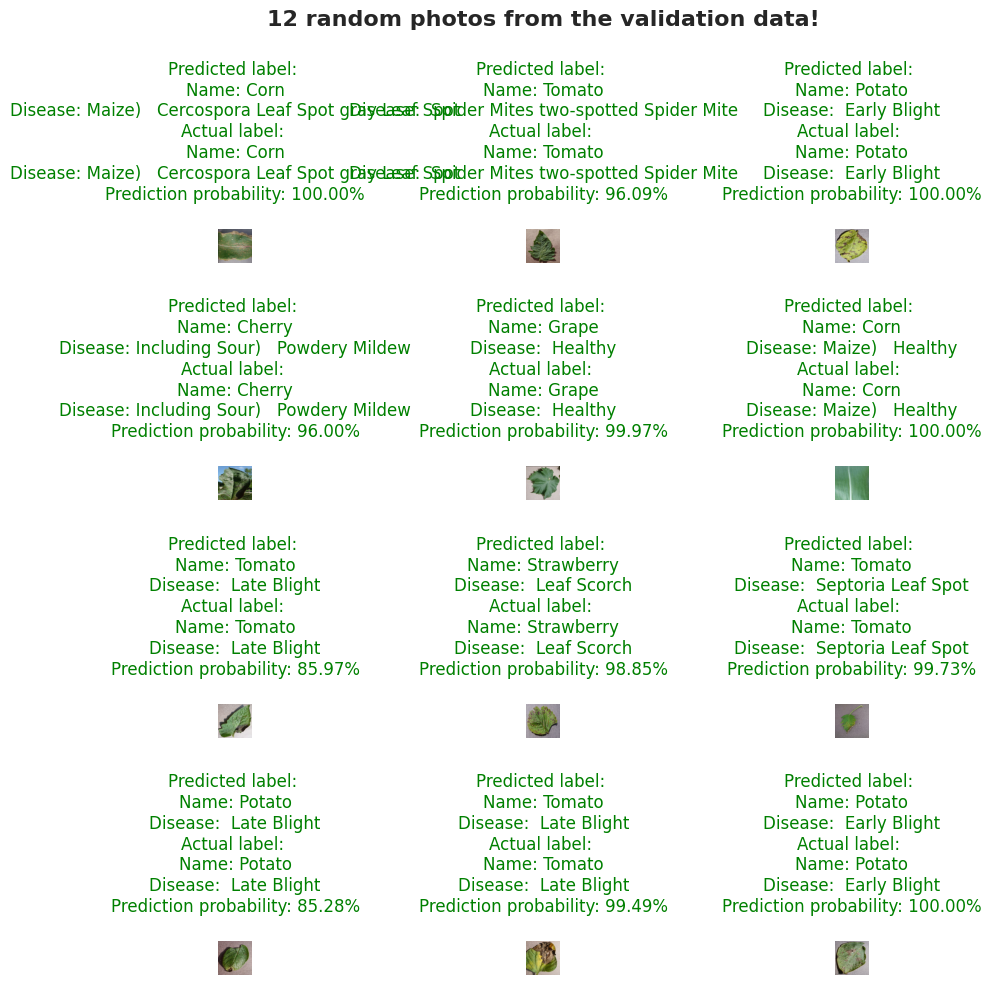

In [ ]:
# plotting 12 random photos with their prediction probabilities, predicted labels and actual labels

plt.figure(figsize=(10, 10))
plt.suptitle('12 random photos from the validation data!', fontsize=16, fontweight='bold')

for i in range(12):  # To display only 10 images
    ax = plt.subplot(4, 3, i + 1)
    ax.imshow(true_images_shuffled[i])

    if true_labels_shuffled[i] == unique_diseases[np.argmax(predictions_shuffled[i])]:
        title_color = 'green'
    else:
        title_color = 'red'

    ax.set_title(f'''
Predicted label:
Name: {return_disease_plant_name(unique_diseases[np.argmax(predictions_shuffled[i])])[0]}
Disease: {return_disease_plant_name(unique_diseases[np.argmax(predictions_shuffled[i])])[1]}
Actual label:
Name: {return_disease_plant_name((true_labels_shuffled[i]))[0]}
Disease: {return_disease_plant_name((true_labels_shuffled[i]))[1]}
Prediction probability: {(max(predictions_shuffled[i]) * 100):.2f}%
        ''',
           color=title_color
           )

    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:

# populating x and y for the plot that follows where
# x is a 2d list containing the top 5 predicted breeds for each dog shown above
# y is  2d list containing the corresponding probabilities for each prediction
x = []
y = []

for prediction in predictions_shuffled:
  top_5_diseases = []
  top_5_predictions = []
  argsorted_prediction_reversed = (np.argsort(prediction)[::-1])[:5]
  for index in argsorted_prediction_reversed:
    top_5_diseases.append(unique_diseases[index])
    top_5_predictions.append(prediction[index])
  x.append(top_5_diseases)
  y.append(top_5_predictions)

In [ ]:
x[0]

['Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Strawberry___healthy',
 'Corn_(maize)___Common_rust_',
 'Apple___Black_rot']

<ipython-input-86-a546e031a9a3>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x[index], rotation=45)


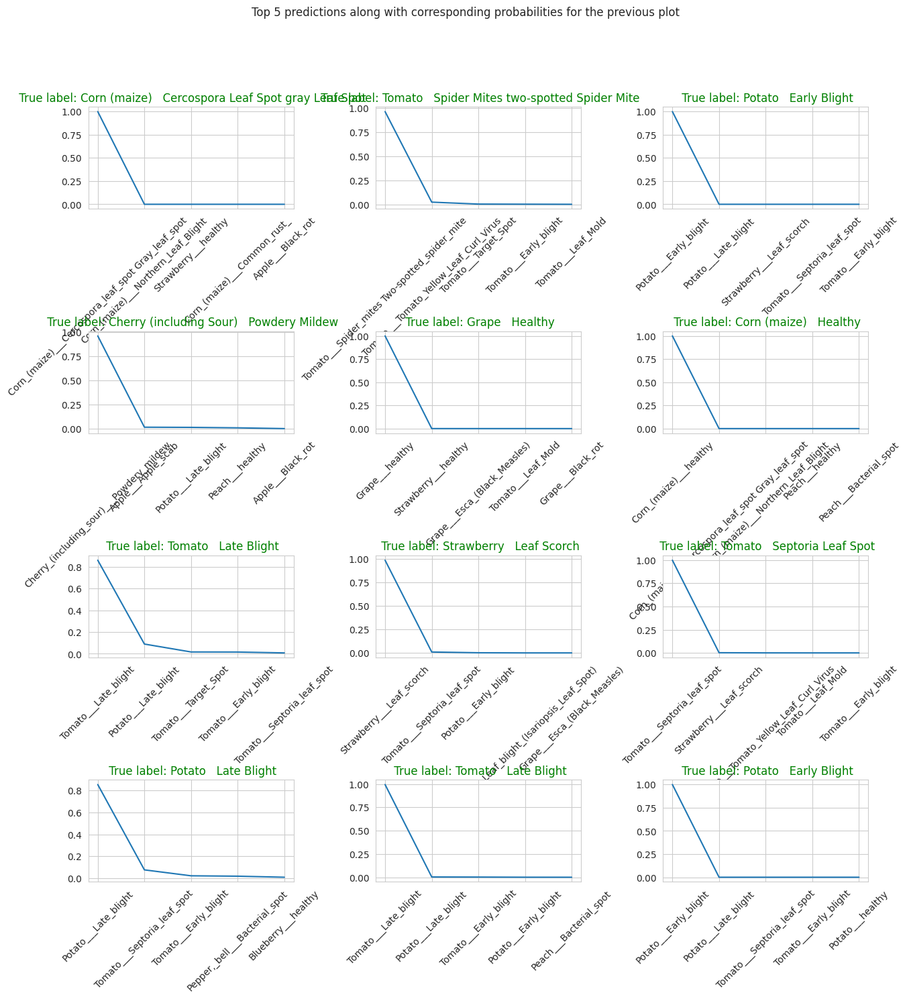

In [ ]:
# Create a new figure with a size of 15x15 inches
plt.figure(figsize=(15, 15))

# Set the main title for the entire visualization
plt.suptitle('''Top 5 predictions along with corresponding probabilities for the previous plot''')

# Loop through 12 data points (assumed) to create subplots
for index in range(12):
    # Create a new subplot at the index position
    ax = plt.subplot(4, 3, index + 1)

    # Plot the data for the current index
    ax.plot(x[index], y[index], label='probability of prediction')

    # Determine the color of the title based on true and predicted labels
    if true_labels_shuffled[index] == unique_diseases[np.argmax(predictions_shuffled[index])]:
        color = 'green'
    else:
        color = 'red'

    # Set the title for the current subplot
    ax.set_title(
        f''' True label: {format_underscores(true_labels_shuffled[index])}''',
        color=color
    )

    # Rotate the x-axis tick labels by 45 degrees for better readability
    ax.set_xticklabels(x[index], rotation=45)

# Adjust the spacing between subplots for better layout
plt.subplots_adjust(wspace=0.4, hspace=1.2)

# Show the final plot with all subplots
plt.show()


In [ ]:
def complete_model_pipeline(image):
    """
    Complete model pipeline for deploying the model using Gradio.

    This function takes an image as input, saves it temporarily to a file,
    loads the image as a test sample, performs prediction using the model,
    and then removes the temporarily saved image. The function returns the
    predicted label

    Args:
        image (np.ndarray): The NumPy array representing the input image.

    Returns:
        str: The predicted label.

    Parameters:
        - image: A NumPy array representing the input image.

    Note: This function is designed to be used with Gradio to deploy the model
    and obtain predictions interactively.

    """

    # Define the file path to temporarily save the image
    image_file_path = '/content/drive/MyDrive/Colab Notebooks/plant-health-project/myImage.jpg'

    # Convert the input NumPy array to a Pillow image object and save it as a file
    image = Image.fromarray(image)
    image.save(image_file_path)

    # Prepare test data for the model using the saved image file
    test_data = get_data_batches(X=[image_file_path], test_data=True, batch_size=1, deployment = True)

    # Perform prediction using the model
    predictions = model.predict(test_data, verbose = 0)

    # Get the index of the highest predicted value and obtain the corresponding breed label
    predicted_label_index = np.argmax(predictions[0])
    predicted_breed_label = unique_diseases[predicted_label_index]

    # Remove the temporarily saved image file
    os.remove(image_file_path)
    result = return_disease_plant_name(predicted_breed_label)
    border = '-' * 40  # Adjust the number of hyphens as needed
    formatted_string = f'''
+----------------------------------------+
|  Name of your plant: {result[0]:<20}
|  Disease your plant is facing: {result[1]:<20}
+----------------------------------------+
'''
    return formatted_string


In [ ]:
iface = gr.Interface(
    fn=complete_model_pipeline,
    inputs="image",
    outputs="text",
    title = "Plant Disease Classification Application",
    description = 'Upload the image of a plant with a disease and get to know which disease it is facing (or not facing :))'
)

iface.launch(share = True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://602849b6632c29637f.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
